<h1 style="background: linear-gradient(to right, #ff6b6b, #4ecdc4); 
           color: white; 
           padding: 20px; 
           border-radius: 10px; 
           text-align: center; 
           font-family: Arial, sans-serif; 
           text-shadow: 2px 2px 4px rgba(0,0,0,0.5);">
  Getting Started with Bedrock Multimodal
</h1>

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px;">
  <br>
  <hr>

  <p>This exercise demonstrates how <b>multimodal embeddings</b> can be used for search and retrieval with a sample product dataset. You'll use <b>Amazon Titan Multimodal embeddings</b> and the <b>Amazon OpenSearch service</b> to enable semantic search across modalities like title, description, and images. This approach allows for discovering related products based on conceptual and visual similarities, beyond mere text matching.</p>

  <ol>
    <li>Installing dependencies</li>
    <li>Convert Image to base64</li>
    <li>Make Multimodal Predictions</li>
    <li>Prompting With Images</li>
    <li>Best Practices for Multimodal Prompting</li>
    <li>Use Cases
      <ul>
        <li>Explain Images</li>
        <li>Information Retrieval</li>
        <li>Text Extraction and Transcription</li>
        <li>Analyze Charts and Graphs</li>
        <li>Improve Accessibility</li>
        <li>Complex Reasoning and Analysis of Documents</li>
      </ul>
    </li>
  </ol>

  <hr>
</div>


### Installing dependencies

In [1]:
# %%capture
# !pip install -r requirements.txt

In [2]:
import boto3
from botocore.exceptions import ClientError
import os
import base64
import json
import requests
from IPython.display import Image, display, Markdown, IFrame

import logging
import sys

logger = logging.getLogger(__name__)

### Convert Image to `base64`


<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">  
  <p>In certain scenarios, you may need to transmit or store image data alongside other data types, like text or structured data. However, since images are binary data, embedding them directly in text-based formats like JSON or HTML can pose challenges. <b>Base64 encoding</b> provides a solution by converting binary data into a text-friendly format.</p>
  
  <p><b>Base64</b> is an encoding scheme that transforms binary data into a sequence of printable ASCII characters. It’s particularly useful when embedding binary data (such as images) in text-based formats or protocols like JSON, HTML, or HTTP requests. This can be essential when working with multimodal models, like <b>Claude3</b>, which can process both text and images.</p>
</div>


In [3]:
def get_base64_encoded_image(image_paths):
    """
    Encode one or more image files or URLs into base64 strings.

    Args:
        image_paths (str or list): A single file path/URL or a list of file paths/URLs.

    Returns:
        tuple: A tuple containing two lists:
            - A list of base64-encoded image strings.
            - A list of corresponding image types.

    Raises:
        ValueError: If an unsupported image format is encountered.
    """
    # Convert input to list if it's a single string
    if isinstance(image_paths, str):
        image_paths = [image_paths]

    images, image_types = [], []

    # Iterate over the image paths/URLs
    for path in image_paths:
        # Check if the path is a URL
        if path.startswith("https://"):
            url_content = requests.get(path).content
            base64_encoded_data = base64.b64encode(url_content)
            base64_string = base64_encoded_data.decode('utf-8')
        # Otherwise, assume it's a file path
        else:
            with open(path, "rb") as image_file:
                binary_data = image_file.read()
                base64_encoded_data = base64.b64encode(binary_data)
                base64_string = base64_encoded_data.decode('utf-8')

        # Determine the image type based on the file extension
        if path.endswith('.png'):
            image_type = 'image/png'
        elif path.endswith('.jpg') or path.endswith('.jpeg'):
            image_type = 'image/jpeg'
        elif path.endswith('.webp'):
            image_type = 'image/webp'
        elif path.endswith('.gif'):
            image_type = 'image/gif'
        else:
            raise ValueError("Only 'jpeg', 'png', 'webp', and 'gif' image formats are currently supported")

        images.append(base64_string)
        image_types.append(image_type)

    return images, image_types

### Make Multimodal Predictions

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  
  <p><b>Multimodal prompting</b> is a technique that allows language models to process and generate responses based on a combination of text and image inputs. The input consists of textual prompts or questions along with one or more images, often encoded in <b>base64 format</b> with types specified.</p>
  
  <p>The language model's architecture and training enable it to understand the relationships between text and visual information. This technique facilitates more <b>contextual and visually grounded interactions</b>, which are useful for tasks such as <b>image captioning, visual question answering</b>, and <b>multimodal content generation</b>.</p>

  <p>The generated response may include textual descriptions, answers, or new multimodal outputs, leveraging both modalities for enhanced capabilities.</p>
</div>


In [4]:
def invoke_claude_3_multimodal(prompt, images, image_types):
    """
    Invoke the Claude-3 multimodal model from Anthropic using AWS Bedrock runtime.

    Args:
        prompt (str): The text prompt to provide to the model.
        images (list): A list of base64-encoded image data.
        image_types (list): A list of MIME types corresponding to the images.

    Returns:
        str: The model's response text.

    Raises:
        ValueError: If an invalid model name is provided.
    """
    # Initialize the Amazon Bedrock runtime client
    client = boto3.client(service_name="bedrock-runtime")
    model_id = "anthropic.claude-3-sonnet-20240229-v1:0"

    # Prepare the multimodal prompt message
    message_content = []

    # Add each image to the message content
    for image, img_type in zip(images, image_types):
        message_content.append({
            "type": "image",
            "source": {
                "type": "base64",
                "media_type": img_type,
                "data": image,
            },
        })
    message_content.append({"type": "text", "text": prompt})

    request_body = {
        "anthropic_version": "bedrock-2023-05-31",
        "max_tokens": 2048,
        "temperature": 0.2,
        "top_p": 1.0,
        "top_k": 250,
        "messages": [
            {
                "role": "user",
                "content": message_content,
            }
        ],
    }

    try:
        response = client.invoke_model(
            modelId=model_id,
            body=json.dumps(request_body),
        )

        # Process and return the response
        result = json.loads(response.get("body").read())
        return result['content'][0]['text']

    except ClientError as err:
        logger.error(
            "Couldn't invoke Claude 3 %s model. Here's why: %s: %s",
            model_id.capitalize(),
            err.response["Error"]["Code"],
            err.response["Error"]["Message"],
        )
        raise

### Prompting With Images

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p><b>Let's try out the multimodal models</b> using prompts containing both <b>images and text</b>.</p>
</div>


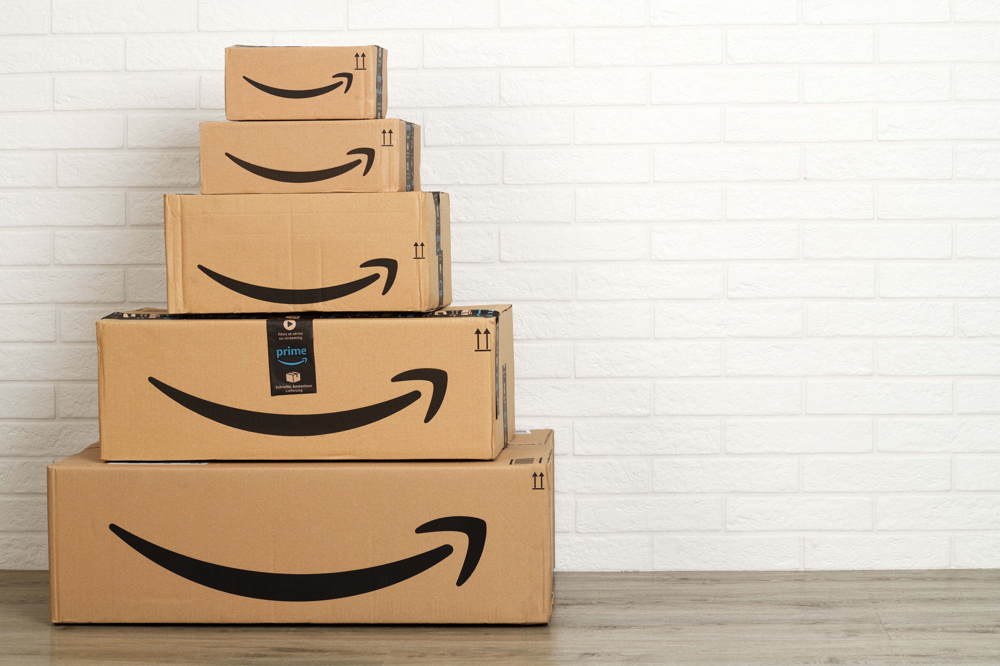

In [5]:
# View Image
Image(filename='data/Amazon-Packages.jpeg', width=600)

### Loading images from local path

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p>To prompt <b>Claude3</b> with local images, convert the image files to <b>base64 encoding</b> and pass them as a list in the <b>"image"</b> parameter of the multimodal request. This allows Claude3 to analyze the base64-encoded images along with the text prompt.</p>

  <p>We will use the helper functions <code>get_base64_encoded_image</code> and <code>invoke_claude_3_multimodal</code> for prompting.</p>
</div>


In [6]:
prompt = "Describe the image."
image_string, image_type = get_base64_encoded_image("data/Amazon-Packages.jpeg")

response = invoke_claude_3_multimodal(prompt=prompt, images=image_string, image_types=image_type)
Markdown("<i>"+response+"</i>")

<i>The image shows a stack of Amazon shipping boxes against a white brick wall. The boxes are the iconic brown cardboard boxes with the black Amazon smile logo printed on them. One of the boxes in the middle has a "prime" label visible, indicating it's part of Amazon's Prime subscription service. The boxes are stacked in a pyramid shape, with the largest box at the bottom and the smaller ones on top, suggesting multiple deliveries or orders. The image represents the ubiquity and convenience of online shopping and Amazon's dominance in the e-commerce market.</i>

### Convert Image to `base64`

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p>There are scenarios where you need to transmit or store <b>image data</b> along with other types of data, such as text or structured data. However, images are inherently <b>binary data</b>, and directly embedding them in text-based formats like <b>JSON or HTML</b> can be problematic. This is where <b>Base64 encoding</b> comes into play, providing a way to represent binary data as text.</p>

  <p><b>Base64</b> is an encoding scheme that converts binary data into a sequence of printable ASCII characters. This encoding is particularly useful when you need to embed binary data (like images) in text-based formats or protocols, such as <b>JSON, HTML,</b> or <b>HTTP requests</b> and responses. This can be especially useful when working with multimodal models like <b>Claude3</b>, which can process both text and images.</p>
</div>


In [7]:
prompt = "Where is the second largest box located?"
image_string, image_type = get_base64_encoded_image("data/Amazon-Packages.jpeg")

response = invoke_claude_3_multimodal(prompt=prompt, images=image_string, image_types=image_type)
Markdown("<i>"+response+"</i>")

<i>In the image, there are several Amazon shipping boxes stacked on top of each other. The second largest box is located directly below the largest box at the top of the stack.</i>

### Best Practices for Multimodal Prompting

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p>As <b>multimodal models</b> become more advanced and capable of understanding different data modalities like text, images, and audio, it's crucial to follow established <b>best practices</b> when prompting these models. Adhering to guidelines helps ensure the outputs generated are relevant and expected.</p>

  <p>Maintain standard best practices for prompting such as providing <b>clear and specific prompts</b>, avoiding ambiguity, and carefully curating the data inputs. Best practices also emphasize the importance of <b>maintaining user privacy</b> and respecting <b>intellectual property rights</b>. For instance, be thoughtful about what images or audio clips are uploaded to avoid unintentionally sharing personal or copyrighted content.</p>

  <p>Moreover, best practices guide users on how to interpret model outputs appropriately, understanding the inherent limitations of AI systems and that responses should be <b>validated against authoritative sources</b>. Following these recommendations ultimately leads to more trustworthy and reliable interactions with cutting-edge AI capabilities.</p>
</div>


#### Know your model's capabilities and limitations



It is important to consider the selected model's known capabilities and limitations while prompting the model. In this lab, we are using the Claude3 models which have the following guidelines for effective prompting:

Claude 3 Models:
- **Input Format**: Images need to be provided in a base64-encoded format.
- **Image Size**: Individual image size cannot exceed 5MB
- **Multiple Images**: Claude 3 models supports prompting with up to 5 images.
- **Image Format**: Supported image formats: 'PNG', 'JPEG', 'WebP' and 'GIF'.
- **Image Clarity**: Clear images which are not too blurry are more effective with Claude 3 models.
- **Image Placement***: Claude 3 models work better when images come before text while prompting. However, if the use case requires, images can follow text or can be interpolated with text.
- **Image Resolution**: If the image's long edge is more than 1568 pixels, or the image is more than ~1600 tokens, it will first be scaled down, preserving aspect ratio, until it is within size limits. If the input image is too large and needs to be resized, it will increase latency of time-to-first-token, without giving you any additional model performance. Very small images under 200 pixels on any given edge may lead to degraded performance.


### Use Cases

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <h4 style="color:#2F4F4F;">1) Explain Images</h4>

  
  <p>When it comes to <b>describing images</b>, multimodal models can be extremely useful. These models can take an image as input and generate a description that captures the important elements and context within the visual. This has a wide range of applications, including helping <b>people with visual impairments</b> understand images, generating <b>image captions</b> for social media posts, or even creating descriptions for <b>product images</b> in online stores to enhance the user experience and improve accessibility.</p>

  <p>Let's use a multimodal model to describe the following architecture of a <b>chatbot application</b> using several AWS products. The application uses <b>Bedrock Knowledge Bases</b> to store content from S3 using <b>OpenSearch vector stores</b>. The chatbot application accesses a Lambda function through a <b>Firewall-protected API Gateway</b>, which then uses Bedrock to generate a response using the retrieved context from the knowledge base. The response is finally returned back to the chatbot application.</p>
</div>


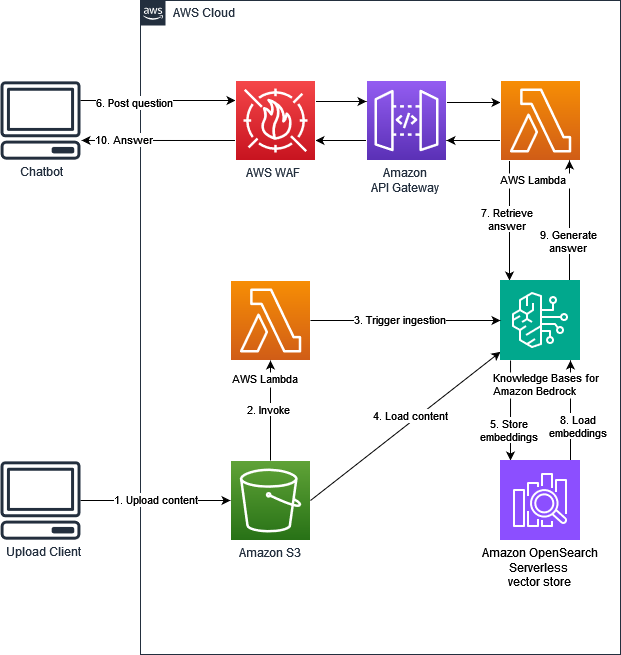

In [8]:
Image("data/Chatbot-Architecture.png", width="100%")

In [9]:
prompt = "The image is an AWS architecture diagram to build a chatbot using AWS services. Which service serves as a vector database for the chatbot?"
image_string, image_type = get_base64_encoded_image("data/Chatbot-Architecture.png")

response = invoke_claude_3_multimodal(prompt=prompt, images=image_string, image_types=image_type)
Markdown("<i>"+response+"</i>")

<i>According to the architecture diagram, Amazon OpenSearch Serverless is used as the vector store for the chatbot application.</i>

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <h4 style="color:#2F4F4F;">Limitation with GIFs and WebP Content</h4>

  <p><b>Multimodal models</b> like <b>Claude3</b> can process and understand various types of input data, such as text, images, and audio. However, there is a limitation when it comes to <b>video or GIF data</b>, as these models lack the native ability to analyze individual frames.</p>

  <p>Videos and GIFs are sequences of images or frames played in rapid succession to create the illusion of motion. Each frame can contain unique visual information, such as <b>movement of objects</b>, changes in lighting or colors, or the appearance or disappearance of elements.</p>

  <p>Several multimodal models, including Claude3, only parse the <b>first frame</b> of a GIF when prompted with it. This limitation prevents the model from analyzing all frames natively, losing the ability to explain the complete animation.</p>

  <p>A possible solution could be <b>stacking all frames</b> into a single image and prompting the model with it. However, this approach makes the image very complex, and the model may not be able to analyze the slight differences in each frame to understand the animation. Recently, a few models have been developed with the ability to process and analyze video frames to describe videos.</p>
</div>


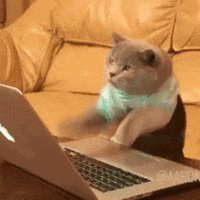

In [10]:
Image("data/marvel.gif", width="2000%")

In [11]:
prompt = "Explain this GIF."
image_string, image_type = get_base64_encoded_image("data/marvel.gif")

response = invoke_claude_3_multimodal(prompt=prompt, images=image_string, image_types=image_type)
Markdown("<i>"+response+"</i>")

<i>This GIF shows a cute and humorous scene of a cat appearing to use a laptop computer. The cat is sitting on a couch or chair, with its front paws resting on the laptop's keyboard as if typing or browsing.

The cat has a grayish-white fur coat and seems to be wearing a light blue or turquoise colored shirt or sweater-like clothing, adding to the anthropomorphized and comical portrayal.

While cats cannot actually operate computers, this GIF playfully depicts the cat mimicking human behavior by "using" the laptop, likely capturing an amusing moment when the cat happened to strike this posture. It's an endearing and funny example of anthropomorphizing pet behavior in a relatable way for amusement.</i>

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <h4 style="color:#2F4F4F;">2) Information Retrieval</h4>

  <p>With <b>documents</b>, these models excel at processing complex layouts and understanding the relationship between <b>text and visual elements</b>. They can <b>extract text from images</b>, understand tables, charts, and graphs, and even interpret handwritten notes. By combining <b>textual and visual understanding</b>, these models provide a comprehensive understanding of the document, making information extraction accurate and contextually aware.</p>

  <p>The key advantage of <b>multimodal models</b> lies in their ability to bring together disparate sources of information and make inferences that were previously challenging for traditional, single-modality AI systems.</p>
</div>


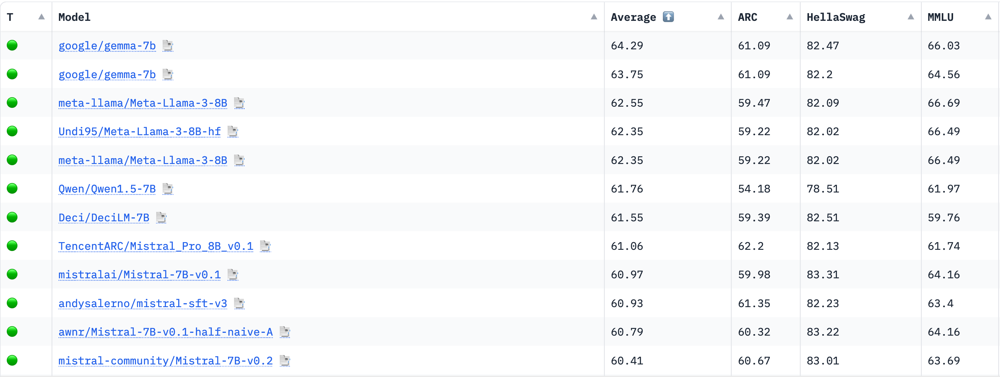

In [12]:
Image("data/LLM Leaderboard.png", width="50%")

In [13]:
prompt = """The image depicts a leaderboard measuring the performance of various open-source LLMs on evaluation tasks such as ARC, Hellaswag, MMLU, TruthfulQA, Winogrande and GSM8K. \
How did Mistral-7B-v0.1 score on MMLU? Find the model name in the first column and find the corresponding evaluation metric in the MMLU column."""
image_string, image_type = get_base64_encoded_image("data/LLM Leaderboard.png")

response = invoke_claude_3_multimodal(prompt=prompt, images=image_string, image_types=image_type)
Markdown("<i>"+response+"</i>")

<i>According to the leaderboard shown in the image, the model named "mistralai/Mistral-7B-v0.1" scored 64.16 on the MMLU evaluation metric.</i>

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <h4 style="color:#2F4F4F;">3) Text Extraction and Transcription</h4>

  <p>For applications such as <b>text extraction</b>, these models can identify and extract relevant information from <b>documents, images,</b> or even videos. They excel at recognizing and interpreting text within complex layouts, such as <b>tables, forms,</b> or <b>infographics</b>. By understanding the context and structure of the source material, the models can accurately extract specific data points, summaries, or key information, making it readily available for further analysis or processing.</p>

  <p>Let's try asking questions about the following image of a <b>receipt</b>. The image shows that the total amount is <b>$20.46</b>, which was authorized on a credit card. Following that, the receipt has the tip amount of <b>$4.00</b> written by hand, as well as the final amount of <b>$24.46</b>, which is also handwritten.</p>
</div>


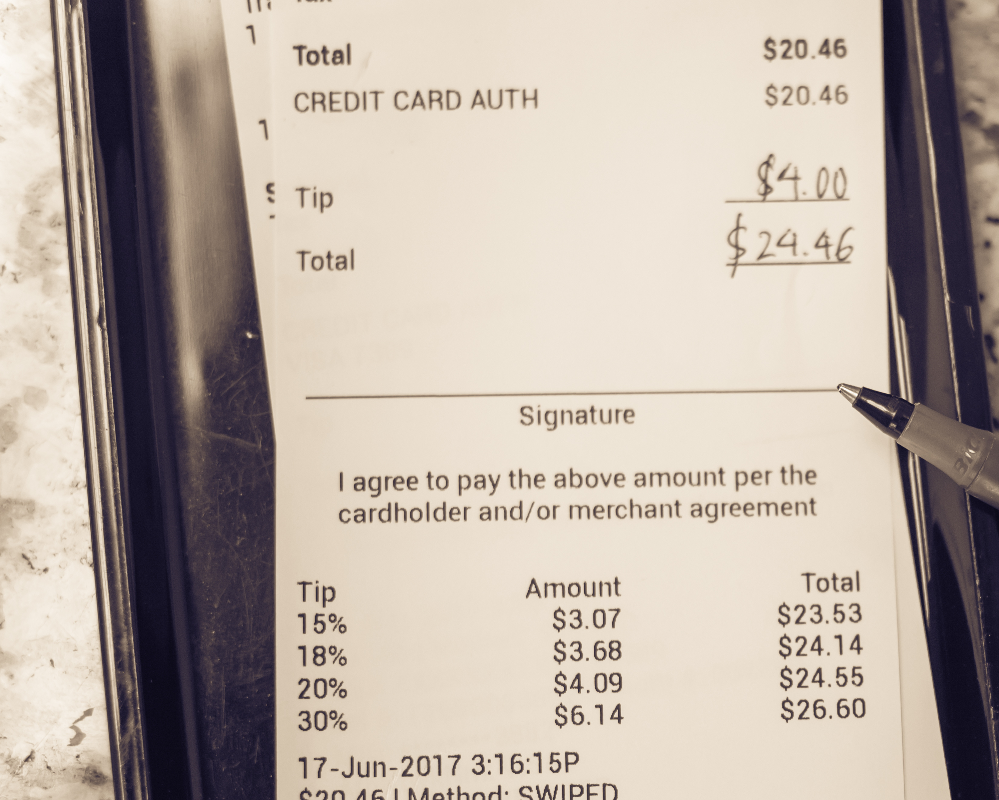

In [14]:
Image("data/Payment-Receipt.jpeg", width=500)

In [15]:
prompt = "What was the total amount paid by the customer? And the date of the transaction?"
image_string, image_type = get_base64_encoded_image("data/Payment-Receipt.jpeg")

response = invoke_claude_3_multimodal(prompt=prompt, images=image_string, image_types=image_type)
Markdown("<i>"+response+"</i>")

<i>According to the receipt shown in the image, the total amount paid by the customer was $24.46. This includes the initial charge of $20.46 plus a $4.00 tip added.

The date of the transaction was 17-Jun-2017 at 3:16:15P, as printed at the bottom of the receipt.</i>

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <h4 style="color:#2F4F4F;">4) Analyze Charts and Graphs</h4>

  <p><b>Multimodal models</b> are now being leveraged to analyze and interpret <b>charts and graphs</b>, offering a powerful way to understand complex data visualizations. With their advanced capabilities, these models can provide valuable insights and support <b>data-driven decision-making</b>.</p>

  <p>These models can identify and classify different types of visualizations, including <b>bar graphs, pie charts, line graphs,</b> and <b>scatter plots</b>. By understanding the structural and visual elements, they can extract crucial information, such as <b>labels, legends, data values,</b> and their relationships.</p>

  <p>One of the key strengths of multimodal models lies in their ability to provide <b>contextual understanding</b>. They can interpret <b>chart titles, axis labels,</b> and <b>captions</b> to grasp the underlying narrative of the visualization. By combining this with their text and image analysis capabilities, they can explain the insights presented, identify trends and patterns, and even generate descriptive summaries or highlight key takeaways.</p>

  <p>Moreover, these models can assist in <b>comparing and contrasting</b> multiple charts, identifying similarities, and relationships between datasets. This capability is particularly useful for spotting anomalies, making predictions, or generating insights that might otherwise be difficult to discern. By bringing together <b>text, image,</b> and even <b>tabular data</b> interpretation, multimodal models enhance the accessibility and comprehension of chart-based information, enabling users to make more informed decisions.</p>

  <p>We will use the following chart illustrating how <b>global average temperatures</b> have changed over the years compared with the average global temperature of the mid-20th century. The chart is plotted at intervals of 20 years. It shows that before the 1950s, average global temperatures were much lower than the mid-20th century temperatures. However, the <b>average global temperatures</b> have steadily increased since then, with an increase of <b>0.89°C</b> higher than mid-20th century temperatures, as recorded in 2022.</p>
</div>


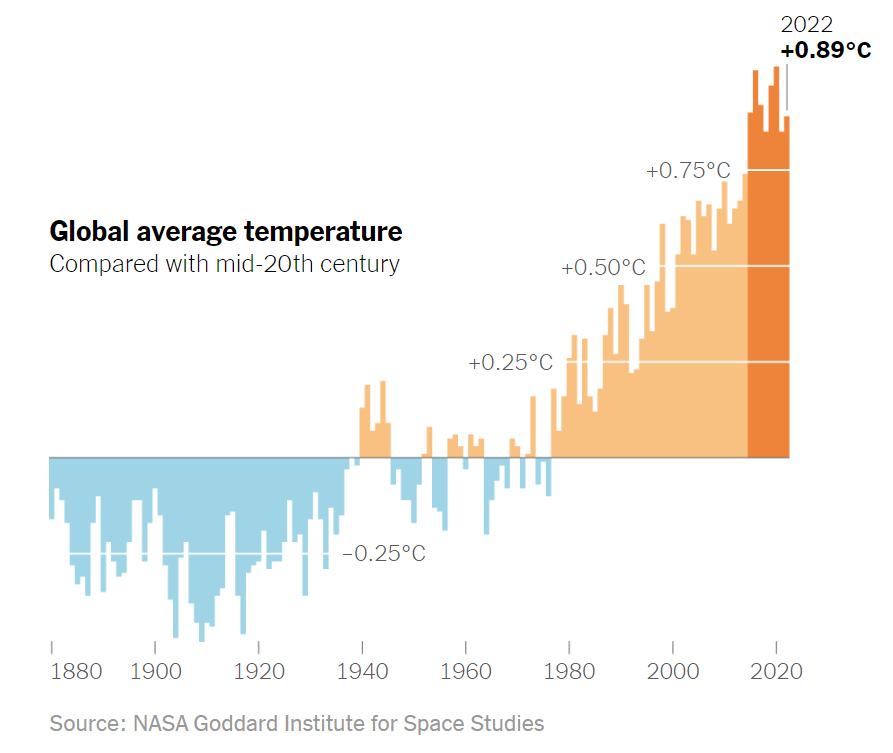

In [16]:
# Image-src: https://www.nytimes.com/2023/01/26/learning/whats-going-on-in-this-graph-feb-1-2023.html
Image("data/NYTimes-climate-data.png", width=800)

In [17]:
prompt = "Explain the trend of global temperature between 1940 and 1980."
image_string, image_type = get_base64_encoded_image("data/NYTimes-climate-data.png")

response = invoke_claude_3_multimodal(prompt=prompt, images=image_string, image_types=image_type)
Markdown("<i>"+response+"</i>")

<i>According to the graph showing the global average temperature compared to the mid-20th century, the temperature trend between 1940 and 1980 was relatively flat or stable. During this period, the temperature fluctuated slightly above and below the mid-20th century baseline, but there was no significant upward or downward trend. The bars representing the temperature values during these decades mostly stay within the range of -0.25°C to +0.25°C, indicating a period of relatively little change in global average temperatures before the more pronounced warming trend began around 1980 and accelerated further in recent decades.</i>

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <h4 style="color:#2F4F4F;">5) Improve Accessibility</h4>

  <p><b>Multimodal models</b> are revolutionizing the field of <b>accessibility</b> by generating descriptive content for images and scenes, making digital content more inclusive for all users.</p>

  <p>One of the key applications of these models is in the creation of <b>alt-text</b> for images. By analyzing the visual content, multimodal models can generate descriptive alt-text that conveys the image's key information. This alt-text is crucial for individuals with <b>visual impairments</b>, as it allows them to understand the context and significance of images through assistive technologies like <b>screen readers</b>. The models can identify objects, recognize scenes, and describe the image's composition, ensuring a rich and detailed portrayal.</p>

  <p>Additionally, these models can provide detailed <b>scene descriptions</b>, offering a narrative-like explanation of what is happening in a given image or video frame. This goes beyond simple object recognition by capturing the atmosphere, actions, and relationships between elements. Scene descriptions are particularly beneficial for those with <b>visual or cognitive disabilities</b>, as they paint a comprehensive mental picture, enhancing their understanding and engagement with the content. We will further explore this application in Lab5.</p>

  <p>Let's consider the following image representing a few keyboard shortcuts along with common keys used for such shortcuts such as 'Alt', 'Ctrl'. Two such shortcuts represented in the image are <b>'Ctrl' + 'C'</b> and <b>'Ctrl' + 'V'</b>, which are commonly used to copy and paste items in Windows devices respectively.</p>
</div>


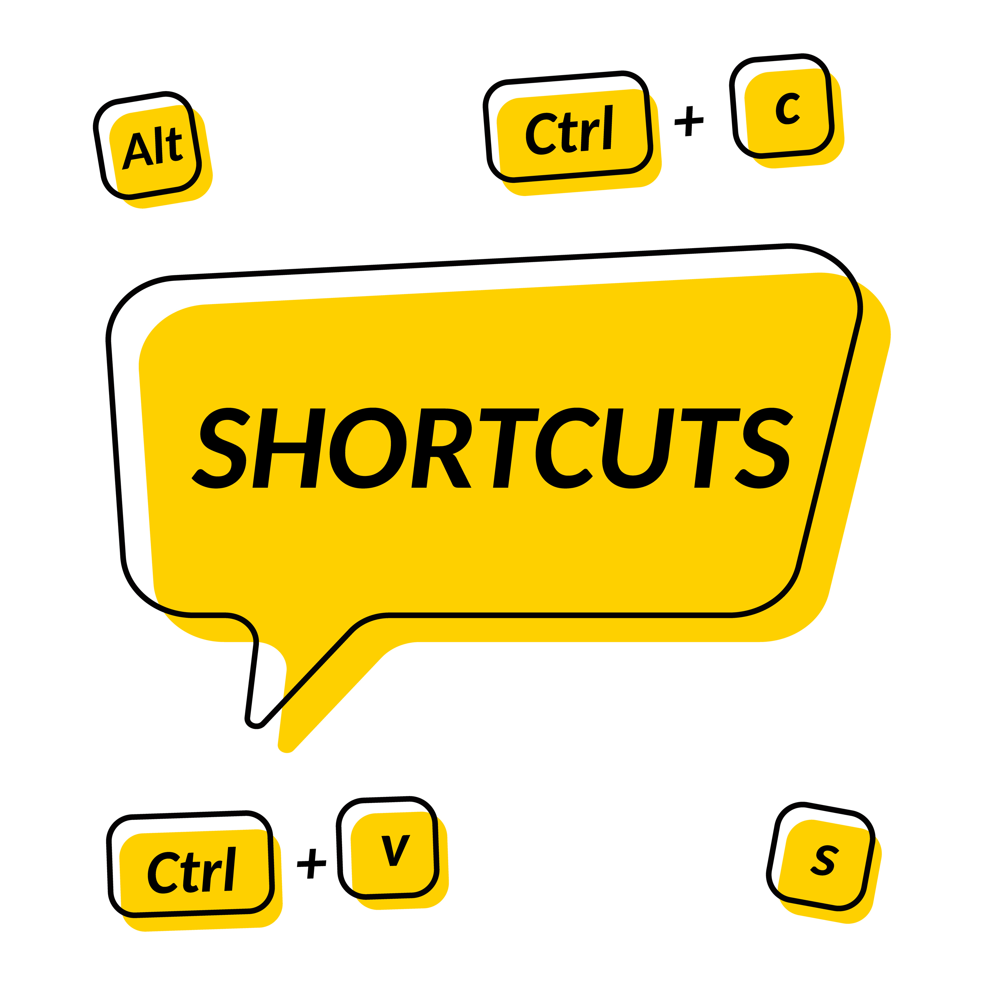

In [18]:
# Image-src: https://www.nytimes.com/2023/01/26/learning/whats-going-on-in-this-graph-feb-1-2023.html
Image("data/shortcuts.jpeg", width=800)

In [19]:
prompt = "Produce alt-text for the given image following the guidelines."
guidelines = """ Guidelines for alt-text:
- Be succinct but convey the same information a sighted customer receives from the image.
- Keep alt text length to 155 characters or less for SEO reasons.
- Don't duplicate text already in the content.
- Avoid phrases like "image of ..." or "graphic of ..." to describe the image. Screen readers already indicate that alt text is part of an image.
- Include punctuation when needed. When screen readers encounter punctuation, they pause before continuing.
- Avoid using all-caps in alt text. Some screen readers read capital letters individually.
"""

image_string, image_type = get_base64_encoded_image("data/shortcuts.jpeg")

response = invoke_claude_3_multimodal(prompt=prompt + "\n" + guidelines, images=image_string, image_types=image_type)
Markdown("<i>"+response+"</i>")

<i>Shortcuts illustration showing keyboard shortcuts Alt+C, Ctrl+V, and Ctrl+S with a speech bubble saying "SHORTCUTS" in bold text.</i>

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <h4 style="color:#2F4F4F;">6) Complex Reasoning and Analysis of Documents</h4>

  <p><b>Multimodal models</b> are effective tools for parsing, analyzing, and retrieving information from <b>documents such as PDFs</b>, offering a seamless way to extract valuable insights from a variety of sources.</p>

  <p>One of the key strengths of these models is their ability to process and understand <b>structured and unstructured data</b> within PDFs. They can parse through <b>tables, forms, charts,</b> and free-form text, recognizing and extracting relevant information. Whether it's extracting specific data points, identifying patterns, or understanding contextual relationships, multimodal models provide a comprehensive understanding of the document's content.</p>

  <p>Another advantage is their capability to interpret and analyze <b>visual elements</b>, such as <b>graphs, diagrams,</b> and images, often found in PDFs. By combining <b>image recognition</b> with textual analysis, these models can explain and provide insights from visual representations, making the information more accessible and actionable. This is particularly useful for industries that rely on visual data, such as <b>engineering, architecture,</b> or <b>scientific research</b>.</p>

  <p>By leveraging the power of <b>multimodal AI</b>, the process of parsing, analyzing, and retrieving information from PDFs becomes more efficient and robust. Models like <b>Claude3</b> enable users to unlock valuable insights, make data-driven decisions, and easily access the information they need, regardless of the document's format or structure. This enhances productivity, facilitates knowledge sharing, and improves the overall user experience when working with PDF documents.</p>
</div>


In [20]:
IFrame("data/Titan Models-Docs.pdf", width=600, height=300)

In [21]:
# Helper function to convert pdf to images
def pdf2img(pdf_path, pdf_pages_dir):
    import pypdfium2 as pdfium
    from PIL import Image as pilimage
    
    pdf = pdfium.PdfDocument(pdf_path)

    if not os.path.exists(pdf_pages_dir):
        os.makedirs(pdf_pages_dir)

    resolution = pdf.get_page(0).render().to_numpy().shape
    scale = 1 if resolution[0] >= 1620 or resolution[1] >=1620 else 300/72
    n_pages = len(pdf)
    for page_number in range(n_pages):
        page = pdf.get_page(page_number)
        pil_image = page.render(
            scale=scale,
            rotation=0,
            crop=(0, 0, 0, 0),
            may_draw_forms=False,
            fill_color=(255, 255, 255, 255),
            draw_annots=False,
            grayscale=False,
        ).to_pil()
        width, height = pil_image.size
        pil_image = pil_image.resize((width//2*2, height//2*2), pilimage.LANCZOS)
        pil_image.save(os.path.join(pdf_pages_dir, "page_{}.png".format(str(page_number).zfill(3))))

In [22]:
def analyse_pdf(prompt, pdf_path):
    
    pdf_pages_dir = "pdf_pages"
    pdf2img(pdf_path=pdf_path, pdf_pages_dir=pdf_pages_dir)
    
    # Check whether the pdf has less than or equal to 5 pages
    if len(os.listdir(pdf_pages_dir)) > 5:
        raise ValueError("For Claude 3, only 5 page PDFs are supported.")
        
    image_strings, image_types = get_base64_encoded_image([os.path.join(pdf_pages_dir, file) for file in sorted(os.listdir(pdf_pages_dir))])
    response = invoke_claude_3_multimodal(prompt=prompt, images=image_strings, image_types=image_types)
    return response

In [23]:
pdf_path = "data/Titan Models-Docs.pdf"
prompt = "What is the 'max token' value for Titan Premier?"

response = analyse_pdf(prompt, pdf_path)
Markdown("<i>"+response+"</i>")

<i>According to the information provided in the image, the Amazon Titan Text G1 - Premier model has a Max tokens value of 32K.</i>